<a href="https://colab.research.google.com/github/BimaBayuUWUUU/2141720019-mobile-2023/blob/master/KEL1_KUIS2PCVK.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **KUIS 2 PCVK**

---
## **Anggota Kelompok 1 :**
---

1. 2141720185 - Adam Rafi Rezandi
2. 2141720003 - Tio Misbaqul Irawan
3. 2141720019 - Bima Bayu Saputra
4. 2141720036 - Lailatul Badriyah
5. 2141720046 - Andi Dwi Prastyo

---
## **Kuis 2 Praktikum**
---

1. Mengerjakan secara kelompok yang terdiri dari 5 anggota
2. Kumpulkan e-ktp anggota keluarga atau kelas pada kelompok minimal 5 buah sebagai dataset. 1 foto bisa berbagai pose ketika pengambilan foto e-ktp.
4. Deteksi dan kenali foto wajah e-ktp tersebut menggunakan metode yang telah dipelajari baik pada matakulilah PCVK ataupun matakuliah lain pada semester ini.
3. Presentasikan di depan kelas hasil dari pekerjaan kelompok Anda, paparkan hasil dari pekerjaan tersebut secara detail lengkap dengan tangkapan layar bagian dari; (1)pre-processing, (2)lokalisasi, (3)segmentasi, dan (4)pengenalan.
5. Jangan lupa upload juga kode program tersebut pada repository
6. Kumpulkan link file presentasi dalam bentuk pdf dan link repository.

### **Library**

In [28]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab import drive
from google.colab.patches import cv2_imshow
import os
import glob
import imutils

### **Drive**

In [38]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### **Load Image**

In [39]:
ktp_images = []
for img in glob.glob('/content/drive/MyDrive/PCVK/KTPKEL1/*'):
   n = cv2.imread(img)
   n = imutils.resize(n,width=640)
   ktp_images.append(n)

### **Pre-prossesing, Lokalisasi dan Face Segmentation**

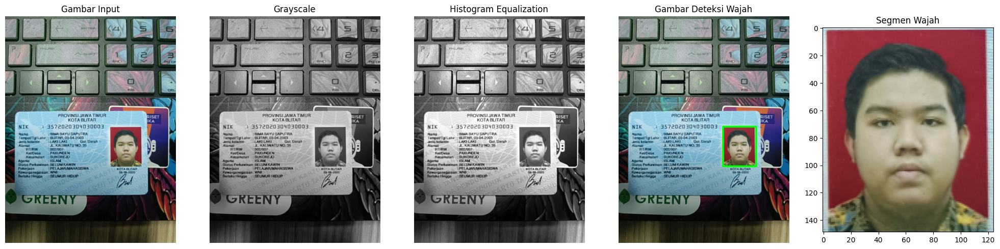

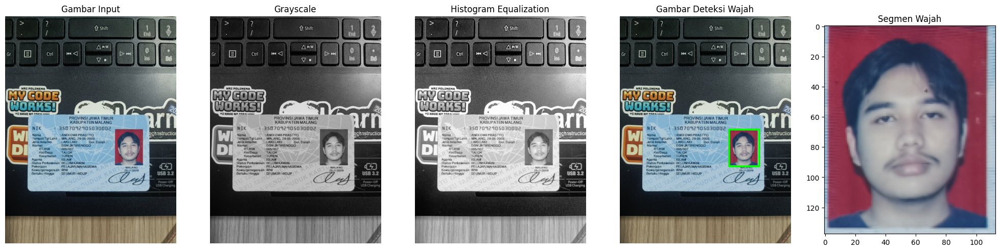

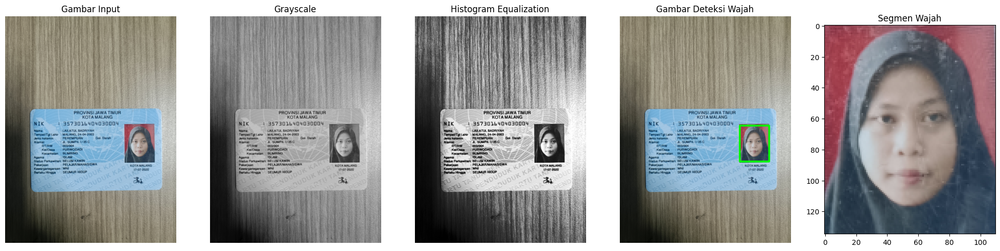

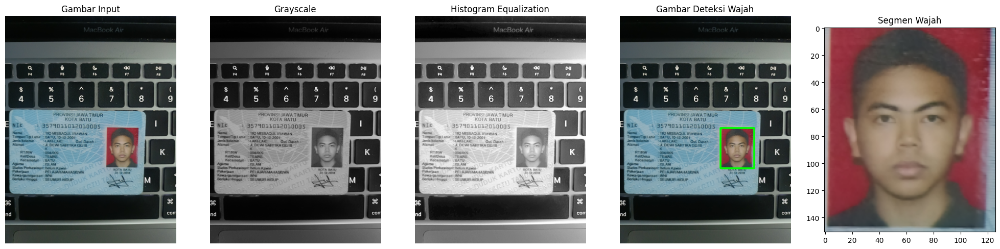

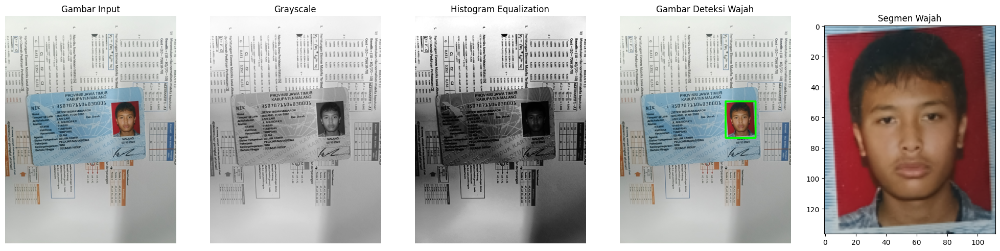

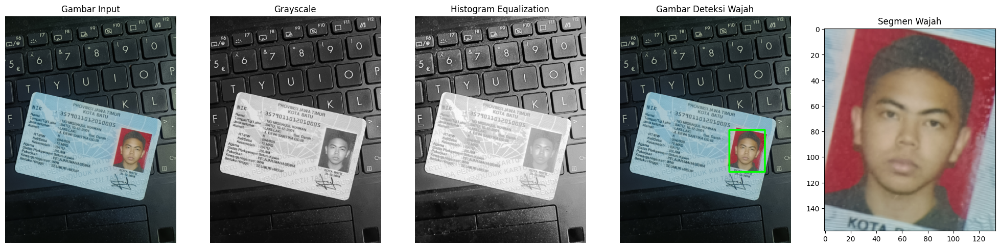

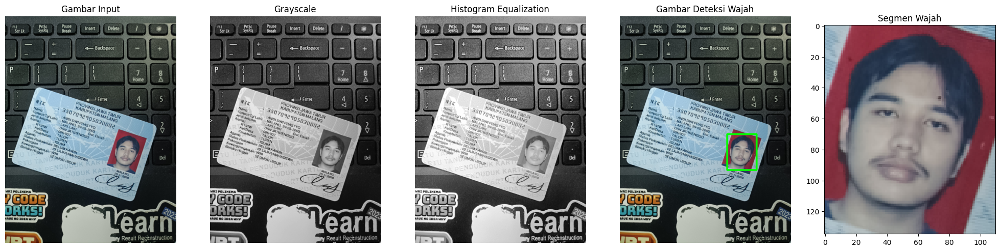

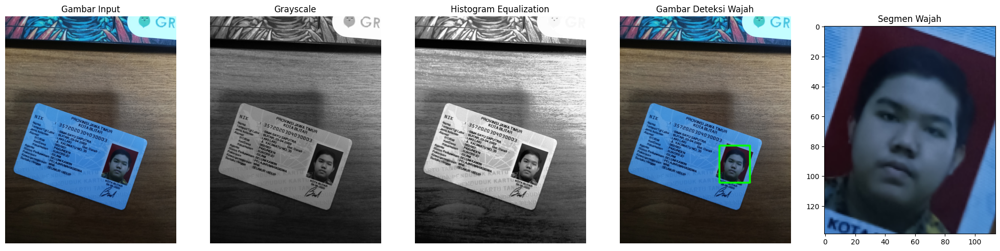

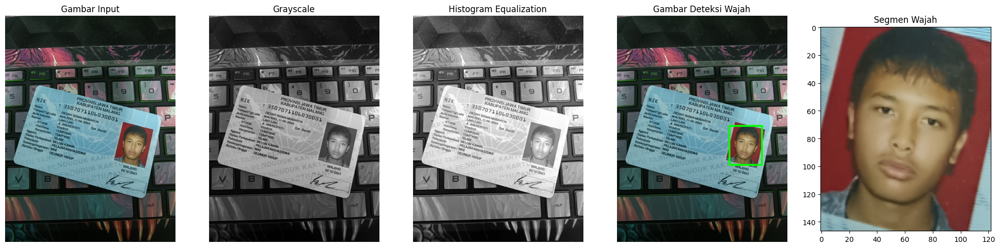

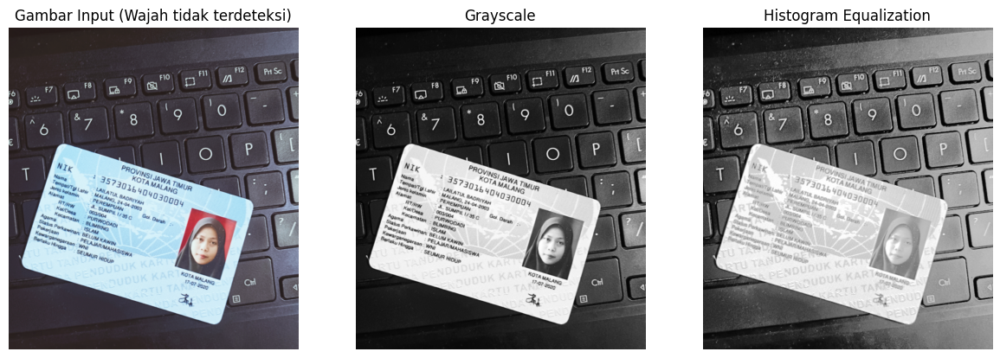

In [45]:
# Memuat Haar Cascade untuk deteksi wajah
haar_cascade = cv2.CascadeClassifier('/content/drive/MyDrive/PCVK/P12/haarcascades/haarcascade_frontalface_alt.xml')

# Tentukan parameter untuk deteksi wajah
mn = [5, 5, 5, 2, 5, 3, 5, 5, 5, 5, 5]  # minNeighbors
sc = [1.2, 1.2, 1.2, 1.2, 1.6, 1.1, 2, 1.2, 1.2, 1.5]  # scaleFactor

# List untuk menyimpan segmen wajah yang terdeteksi
face_segments = []

# Loop melalui setiap gambar di ktp_images
for i, ktp in enumerate(ktp_images):
    # Buat salinan gambar input untuk deteksi wajah
    facedet_img = ktp.copy()

    # Konversi gambar ke Grayscale
    gray_img = cv2.cvtColor(facedet_img, cv2.COLOR_BGR2GRAY)

    # Lakukan Histogram Equalization pada gambar Grayscale
    equalized_img = cv2.equalizeHist(gray_img)

    # Deteksi wajah pada gambar yang sudah diequalisasi menggunakan Haar Cascade
    faces_rects = haar_cascade.detectMultiScale(equalized_img, scaleFactor=sc[i], minNeighbors=mn[i])

    # Periksa apakah ada wajah yang terdeteksi
    if len(faces_rects) == 0:
        # Tampilkan hasil menggunakan Matplotlib
        plt.figure(figsize=(25, 6))

        # Gambar Asli
        plt.subplot(151)
        plt.imshow(cv2.cvtColor(ktp, cv2.COLOR_BGR2RGB))
        plt.title('Gambar Input (Wajah tidak terdeteksi)')
        plt.axis('off')

        # Gambar Grayscale
        plt.subplot(152)
        plt.imshow(gray_img, cmap='gray')
        plt.title('Grayscale')
        plt.axis('off')

        # Gambar Equalized
        plt.subplot(153)
        plt.imshow(equalized_img, cmap='gray')
        plt.title('Histogram Equalization')
        plt.axis('off')
    else:
        # Loop melalui wajah yang terdeteksi
        for (x, y, w, h) in faces_rects:
            # Gambar persegi panjang di sekitar wajah yang terdeteksi di facedet_img
            cv2.rectangle(facedet_img, (x-15, y-30), (x+w+15, y+h+25), (0, 255, 0), 5)

            # Ekstrak segmen wajah dari gambar asli
            face_segment = ktp[y-30:y+h+25, x-15:x+w+15]

            # Tambahkan segmen wajah ke dalam list
            face_segments.append(face_segment)

        # Tampilkan hasil menggunakan Matplotlib
        plt.figure(figsize=(25, 6))

        # Gambar Asli
        plt.subplot(151)
        plt.imshow(cv2.cvtColor(ktp, cv2.COLOR_BGR2RGB))
        plt.title('Gambar Input')
        plt.axis('off')

        # Gambar Grayscale
        plt.subplot(152)
        plt.imshow(gray_img, cmap='gray')
        plt.title('Grayscale')
        plt.axis('off')

        # Gambar Equalized
        plt.subplot(153)
        plt.imshow(equalized_img, cmap='gray')
        plt.title('Histogram Equalization')
        plt.axis('off')

        # Gambar dengan Persegi Panjang Deteksi Wajah
        plt.subplot(154)
        plt.imshow(cv2.cvtColor(facedet_img, cv2.COLOR_BGR2RGB))
        plt.title('Gambar Deteksi Wajah')
        plt.axis('off')

        # Tampilkan segmen wajah
        plt.subplot(155)
        plt.imshow(cv2.cvtColor(face_segment, cv2.COLOR_BGR2RGB))
        plt.title('Segmen Wajah')

        # Tampilkan plot
        plt.show()

In [46]:
from keras.models import load_model

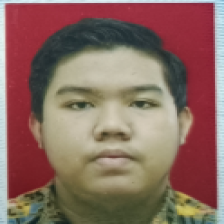

1/1 [==============================] - 1s 1s/step
[[0.00125235 0.00095089 0.01366516 0.96715    0.01698166]]
Class: bima
Confidence Score: 97 %


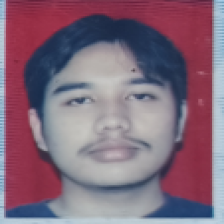

1/1 [==============================] - 0s 59ms/step
[[0.00000319 0.00012677 0.9875365  0.00004014 0.01229345]]
Class: andi
Confidence Score: 99 %


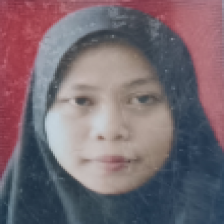

1/1 [==============================] - 0s 66ms/step
[[0.00000031 0.9972114  0.00000565 0.00000009 0.00278248]]
Class: laila
Confidence Score: 100 %


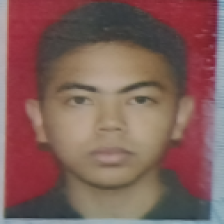

1/1 [==============================] - 0s 53ms/step
[[0.72115844 0.00050353 0.07106195 0.00171862 0.20555745]]
Class: tio
Confidence Score: 72 %


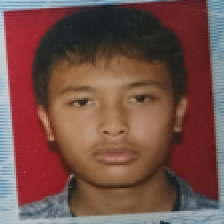

1/1 [==============================] - 0s 54ms/step
[[0.00005284 0.000031   0.00004512 0.00002976 0.9998412 ]]
Class: adam
Confidence Score: 100 %


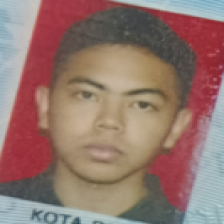

1/1 [==============================] - 0s 62ms/step
[[0.9771104  0.01662313 0.00025358 0.00048746 0.00552533]]
Class: tio
Confidence Score: 98 %


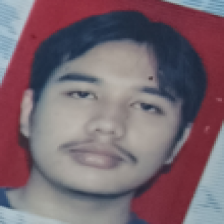

1/1 [==============================] - 0s 49ms/step
[[0.00017937 0.04481466 0.89370716 0.00064307 0.06065573]]
Class: andi
Confidence Score: 89 %


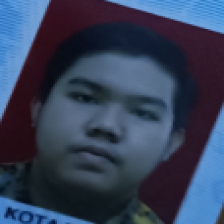

1/1 [==============================] - 0s 52ms/step
[[0.00034724 0.16240332 0.01360038 0.823332   0.00031705]]
Class: bima
Confidence Score: 82 %


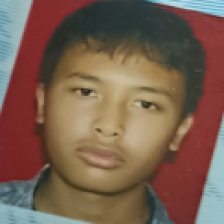

1/1 [==============================] - 0s 56ms/step
[[0.00031353 0.0008303  0.00089515 0.00010323 0.99785775]]
Class: adam
Confidence Score: 100 %


In [47]:
# Disable scientific notation for clarity
np.set_printoptions(suppress=True)

# Load the model
model = load_model("/content/drive/MyDrive/PCVK/keras_model.h5", compile=False)

# Load the labels
class_names = open("/content/drive/MyDrive/PCVK/labels.txt", "r").readlines()

for face_segment in face_segments:
  # Resize the raw image into (224-height,224-width) pixels
  image = cv2.resize(face_segment, (224, 224), interpolation=cv2.INTER_AREA)

  # Show the image in a window
  cv2_imshow(image)

  # Make the image a numpy array and reshape it to the models input shape.
  image = np.asarray(image, dtype=np.float32).reshape(1, 224, 224, 3)

  # Normalize the image array
  image = (image / 127.5) - 1

  # Predicts the model
  prediction = model.predict(image)

  print(prediction)
  index = np.argmax(prediction)
  class_name = class_names[index]
  confidence_score = prediction[0][index]

  # Print prediction and confidence score
  print("Class:", class_name[2:], end="")
  print("Confidence Score:", str(np.round(confidence_score * 100))[:-2], "%")
